# 1 - Libraries

In [1]:
import os
import PIL
import cv2
import glob
import math
import scipy
import keras
import random
import pathlib
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from tensorflow.keras.preprocessing import image
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, BatchNormalization, Flatten, Dense, Dropout, Reshape, Layer, Activation, Concatenate

from keras import metrics
from keras import backend as K
from keras.metrics import Recall
from keras.optimizers import SGD, Adam

from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, precision_score, recall_score, accuracy_score, f1_score, ConfusionMatrixDisplay

from collections import Counter

# 2 - Data Loading

In [2]:
train_path = r"C:\Users\dinda\OneDrive\Documents\KULIAH\Skripsi\archive\skin-lesions\train"
valid_path = r"C:\Users\dinda\OneDrive\Documents\KULIAH\Skripsi\archive\skin-lesions\valid"
test_path = r"C:\Users\dinda\OneDrive\Documents\KULIAH\Skripsi\archive\skin-lesions\test"

## 2.1 - Training Data Loading

In [3]:
melanoma_train_dir = os.path.join(train_path, 'melanoma')
nevus_train_dir = os.path.join(train_path, 'nevus')
keratosis_train_dir = os.path.join(train_path, 'seborrheic_keratosis')

melanoma_train_glob = glob.glob(melanoma_train_dir + '/*.jpg')
nevus_train_glob = glob.glob(nevus_train_dir + '/*.jpg')
keratosis_train_glob = glob.glob(keratosis_train_dir + '/*.jpg')

## 2.2 - Validation Data Loading

In [4]:
melanoma_valid_dir = os.path.join(valid_path, 'melanoma')
nevus_valid_dir = os.path.join(valid_path, 'nevus')
keratosis_valid_dir = os.path.join(valid_path, 'seborrheic_keratosis')

melanoma_valid_glob = glob.glob(melanoma_valid_dir + '/*.jpg')
nevus_valid_glob = glob.glob(nevus_valid_dir + '/*.jpg')
keratosis_valid_glob = glob.glob(keratosis_valid_dir+ '/*.jpg')

## 2.3 - Testing Data Loading

In [5]:
melanoma_test_dir = os.path.join(test_path, 'melanoma')
nevus_test_dir = os.path.join(test_path, 'nevus')
keratosis_test_dir = os.path.join(test_path, 'seborrheic_keratosis')

melanoma_test_glob = glob.glob(melanoma_test_dir + '/*.jpg')
nevus_test_glob = glob.glob(nevus_test_dir + '/*.jpg')
keratosis_test_glob = glob.glob(keratosis_test_dir+ '/*.jpg')

# 3 - EDA

## 3.1 - Data Distribution

In [3]:
labels = ['Melanoma', 'Nevus', 'Seborrheic Keratosis']

### 3.1.1 - Training Data Distribution

In [7]:
train_counts = [len(melanoma_train_glob), len(nevus_train_glob), len(keratosis_train_glob)]

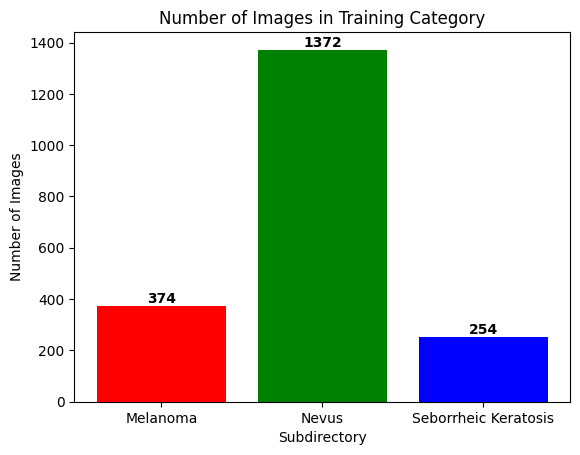

In [8]:
plt.bar(labels, train_counts, color = ['red', 'green', 'blue'])
plt.title('Number of Images in Training Category')
plt.xlabel('Subdirectory')
plt.ylabel('Number of Images')

for i, count in enumerate(train_counts):
    plt.text(i, count, str(count), ha='center', va='bottom', fontweight='bold')

plt.show()

### 3.1.2 - Validation Data Distribution

In [9]:
valid_counts = [len(melanoma_valid_glob), len(nevus_valid_glob), len(keratosis_valid_glob)]

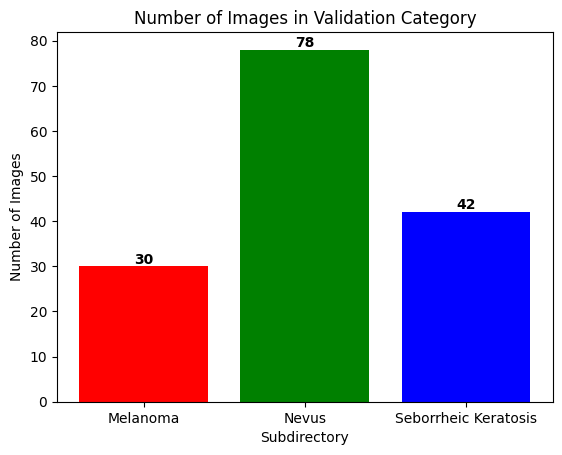

In [10]:
plt.bar(labels, valid_counts, color = ['red', 'green', 'blue'])
plt.title('Number of Images in Validation Category')
plt.xlabel('Subdirectory')
plt.ylabel('Number of Images')

for i, count in enumerate(valid_counts):
    plt.text(i, count, str(count), ha='center', va='bottom', fontweight='bold')

plt.show()

### 3.1.3 - Testing Data Distribution

In [11]:
test_counts = [len(melanoma_test_glob), len(nevus_test_glob), len(keratosis_test_glob)]

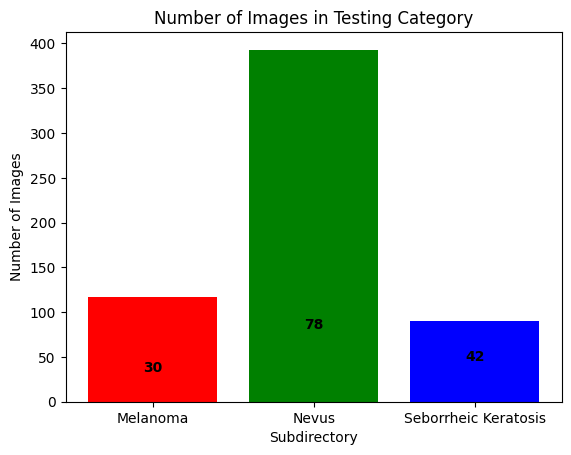

In [12]:
plt.bar(labels, test_counts, color = ['red', 'green', 'blue'])
plt.title('Number of Images in Testing Category')
plt.xlabel('Subdirectory')
plt.ylabel('Number of Images')

for i, count in enumerate(valid_counts):
    plt.text(i, count, str(count), ha='center', va='bottom', fontweight='bold')

plt.show()

## 3.2 - Data Shape

### 3.2.1 - Training Data Shape

In [14]:
random_index = np.random.randint(0, len(melanoma_train_glob)-1)

img_melanoma = cv2.imread(melanoma_train_glob[random_index])
img_nevus = cv2.imread(nevus_train_glob[random_index])
img_keratosis = cv2.imread(keratosis_train_glob[random_index])

print('Shape of Melanoma Images:', img_melanoma.shape)
print('Shape of Nevus Images:', img_nevus.shape)
print('Shapee in Keratosis Images:', img_keratosis.shape)

Shape of Melanoma Images: (1129, 1503, 3)
Shape of Nevus Images: (767, 1022, 3)
Shapee in Keratosis Images: (2000, 3008, 3)


### 3.2.2 - Validation Data Shape

In [15]:
random_index = np.random.randint(0, len(melanoma_valid_glob)-1)

img_melanoma = cv2.imread(melanoma_valid_glob[random_index])
img_nevus = cv2.imread(nevus_valid_glob[random_index])
img_keratosis = cv2.imread(keratosis_valid_glob[random_index])

print('Shape of Melanoma Images:', img_melanoma.shape)
print('Shape of Nevus Images:', img_nevus.shape)
print('Shapee in Keratosis Images:', img_keratosis.shape)

Shape of Melanoma Images: (4459, 6688, 3)
Shape of Nevus Images: (2000, 3008, 3)
Shapee in Keratosis Images: (1936, 2592, 3)


### 3.2.3 - Testing Data Shape

In [17]:
random_index = np.random.randint(0, len(melanoma_test_glob)-1)

img_melanoma = cv2.imread(melanoma_test_glob[random_index])
img_nevus = cv2.imread(nevus_test_glob[random_index])
img_keratosis = cv2.imread(keratosis_test_glob[random_index])

print('Shape of Melanoma Images:', img_melanoma.shape)
print('Shape of Nevus Images:', img_nevus.shape)
print('Shapee in Keratosis Images:', img_keratosis.shape)

Shape of Melanoma Images: (2848, 4288, 3)
Shape of Nevus Images: (2848, 4288, 3)
Shapee in Keratosis Images: (2592, 3872, 3)


## 3.3 - Mean Image Class

In [19]:
def find_mean_img(image_filenames):
    images = []
    
    for filename in image_filenames:
        img = cv2.imread(filename)
        img = cv2.resize(img, (224, 224))
        
        img = np.array(img, dtype=np.float32)
        images.append(img)
    
    mean_image = np.mean(images, axis=0)
    
    mean_image = np.array(mean_image, dtype=np.uint8)
    
    return mean_image

In [20]:
melanoma_mean = find_mean_img(melanoma_train_glob)
nevus_mean = find_mean_img(nevus_train_glob)
keratosis_mean = find_mean_img(keratosis_train_glob)

Text(0.5, 1.0, 'Seborrheic Keratosis')

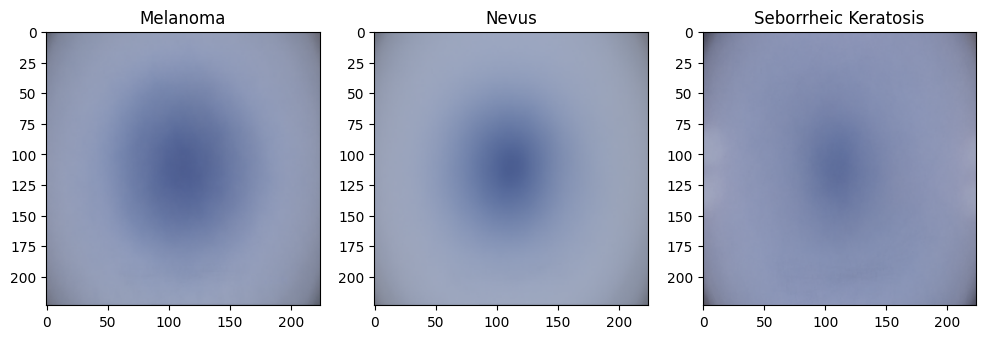

In [21]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))


ax[0].imshow(melanoma_mean)
ax[0].set_title("Melanoma")

ax[1].imshow(nevus_mean)
ax[1].set_title("Nevus")

ax[2].imshow(keratosis_mean)
ax[2].set_title("Seborrheic Keratosis")

# 4 - Preprocessing

## 4.1 - Raw Data Generator

In [22]:
datagen = ImageDataGenerator(rescale=1./255.)

train_gen = datagen.flow_from_directory(
    train_path,
    target_size=(224,224),
    class_mode='categorical',
    batch_size=128,
    shuffle=True
)

valid_gen = datagen.flow_from_directory(
    valid_path,
    target_size=(224,224),
    class_mode='categorical',
    batch_size=128,
    shuffle=False
)

test_gen = datagen.flow_from_directory(
    test_path,
    target_size=(224,224),
    class_mode='categorical',
    batch_size=128,
    shuffle=False
)

Found 2000 images belonging to 3 classes.
Found 150 images belonging to 3 classes.
Found 600 images belonging to 3 classes.


## 4.2 - Augmentation

In [5]:
# Creating data generator for augmentation
datagen_aug = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

In [6]:
# Load training data
train_gen_aug = datagen.flow_from_directory(
    train_path,
    target_size=(224, 224),
    class_mode='categorical',
    batch_size=1,
    shuffle=False
)

# Get features and labels from the training generator
x_train = np.concatenate([train_gen_aug[i][0] for i in range(len(train_gen_aug))])
y_train = np.concatenate([train_gen_aug[i][1] for i in range(len(train_gen_aug))])

# Determine the desired number of augmented images for each class
num_augmented_images_per_class = 1372

# Perform data augmentation on the training data
x_train_aug = []
y_train_aug = []

# Count the number of images per class in the training data
class_counts = Counter(np.argmax(y_train, axis=1))

for class_label, count in class_counts.items():
    # Determine the number of augmented images needed for each class
    num_augmented_images = num_augmented_images_per_class - count
    
    # Select images from a specific class
    class_indices = np.where(np.argmax(y_train, axis=1) == class_label)[0]
    class_images = x_train[class_indices]
    class_labels = y_train[class_indices]
    
    # Perform augmentation on images from a specific class
    aug_iter = datagen_aug.flow(class_images, class_labels, batch_size=1)
    for _ in range(num_augmented_images):
        aug_img, aug_label = next(aug_iter)
        x_train_aug.append(aug_img[0])
        y_train_aug.append(aug_label[0])

# Convert augmented results to numpy arrays
x_train_aug = np.array(x_train_aug)
y_train_aug = np.array(y_train_aug)

# Combine the original training data with the augmented data
x_train_aug = np.concatenate((x_train, x_train_aug), axis=0)
y_train_aug = np.concatenate((y_train, y_train_aug), axis=0)

Found 2000 images belonging to 3 classes.


In [7]:
train_gen_aug = datagen_aug.flow(
    x_train_aug, y_train_aug,
    batch_size=128,
    shuffle=True
)

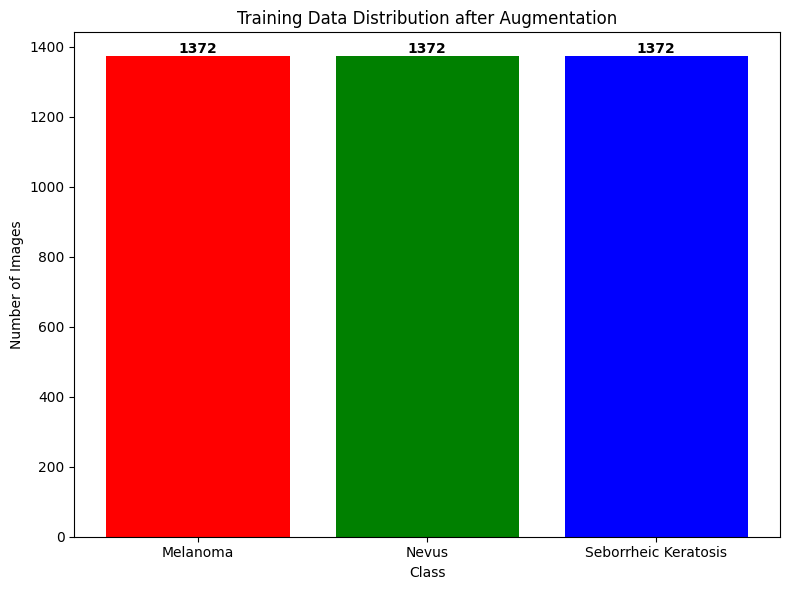

In [ ]:
# Getting image counts for each class after augmentation
y_train_aug_labels = np.argmax(y_train_aug, axis=1)
class_counts_final = Counter(y_train_aug_labels)
class_labels_final = list(class_counts_final.keys())
class_sizes_final = list(class_counts_final.values())

# Creating distribution plot of training images after augmentation
plt.figure(figsize=(8, 6))
plt.bar(range(len(class_labels_final)), class_sizes_final, color=['red', 'green', 'blue'])
plt.title('Training Data Distribution after Augmentation')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.xticks(range(len(class_labels_final)), ['Melanoma', 'Nevus', 'Seborrheic Keratosis'])

for i, count in enumerate(class_sizes_final):
    plt.text(i, count, str(count), ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

# 5 - Model Development

## 5.1 - Architecture

In [4]:
input_dim = (224, 224, 3)
num_classes = len(labels)

In [5]:
# Input
input_model = Input(shape=input_dim)

# Conv Block 1
layer_model = Conv2D(96, kernel_size=(11, 11), strides=(4, 4), padding='valid')(input_model)
layer_model = BatchNormalization()(layer_model)
layer_model = Activation('relu')(layer_model)
layer_model = MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(layer_model)

# Conv Block 2
layer_model = Conv2D(256, kernel_size=(5, 5), padding='same')(layer_model)
layer_model = BatchNormalization()(layer_model)
layer_model = Activation('relu')(layer_model)
layer_model = MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(layer_model)

# Conv Block 3
layer_model = Conv2D(384, kernel_size=(3, 3), activation='relu', padding='same')(layer_model)

# Conv Block 4
layer_model = Conv2D(448, kernel_size=(3, 3), activation='relu', padding='same')(layer_model)
layer_model = MaxPooling2D(pool_size=(2, 2))(layer_model)
layer_model = BatchNormalization()(layer_model)

# Conv Block 5
layer_model = Conv2D(384, kernel_size=(3, 3), activation='relu', padding='same')(layer_model)
layer_model = Dropout(0.25)(layer_model)

# Flatten
layer_model = Flatten()(layer_model)

# Dense Block 1
layer_model = Dense(4096, activation='relu')(layer_model)
layer_model = BatchNormalization()(layer_model)
layer_model = Dropout(0.5)(layer_model)

# Dense Block 2
layer_model = Dense(1024, activation='relu')(layer_model)
layer_model = Dropout(0.5)(layer_model)

# Dense Block 2
layer_model = Dense(512, activation='relu')(layer_model)
layer_model = Dropout(0.5)(layer_model)

# Output Layer
output_model = Dense(num_classes, activation='softmax')(layer_model)

# Create the model
model = Model(inputs=input_model, outputs=output_model)

# Compile the model
opt = Adam(learning_rate=0.001)
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['Recall'])

# Print the model summary
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 54, 54, 96)     │        34,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 54, 54, 96)     │           384 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 54, 54, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 26, 26, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 26, 26, 256)    │       614,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 26, 26, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 26, 26, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 12, 12, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 12, 12, 384)    │       885,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 12, 12, 448)    │     1,548,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 6, 6, 448)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 6, 6, 448)      │         1,792 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 6, 6, 384)      │     1,548,672 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 6, 6, 384)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 13824)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4096)           │    56,627,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 4096)           │        16,384 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1024)           │     4,195,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             

 Total params: 66,000,579 (251.77 MB)

 Trainable params: 65,990,787 (251.73 MB)

 Non-trainable params: 9,792 (38.25 KB)

## 5.2 - Training

In [14]:
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [17]:
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss', 
    factor=0.2, 
    patience=5, 
    min_lr=1e-6, 
    verbose=1
)

In [18]:
early_stop = EarlyStopping(
    monitor='val_loss',
    min_delta=0.001,
    patience=20,
    verbose=1, 
    restore_best_weights=True
)

In [ ]:
checkpoint_filepath = 'model_IC_skripsi.keras'

checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

In [ ]:
%%time
history = model.fit(
    train_gen_aug, 
    epochs=50, 
    validation_data=valid_gen, 
    callbacks=[checkpoint_callback, reduce_lr, early_stop]
)

Epoch 1/50
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - Recall: 0.3485 - loss: 2.4441
Epoch 1: val_loss improved from inf to 3.89388, saving model to model_IC_skripsi.keras
33/33 ━━━━━━━━━━━━━━━━━━━━ 75s 2s/step - Recall: 0.3484 - loss: 2.4386 - val_Recall: 0.3333 - val_loss: 3.8939 - learning_rate: 0.0010
Epoch 2/50
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - Recall: 0.3492 - loss: 1.4825
Epoch 2: val_loss improved from 3.89388 to 1.12708, saving model to model_IC_skripsi.keras
33/33 ━━━━━━━━━━━━━━━━━━━━ 70s 2s/step - Recall: 0.3487 - loss: 1.4797 - val_Recall: 0.0299 - val_loss: 1.1271 - learning_rate: 0.0010
Epoch 3/50
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - Recall: 0.3465 - loss: 1.1336
Epoch 3: val_loss improved from 1.12708 to 1.09245, saving model to model_IC_skripsi.keras
33/33 ━━━━━━━━━━━━━━━━━━━━ 68s 2s/step - Recall: 0.3459 - loss: 1.1331 - val_Recall: 0.0000e+00 - val_loss: 1.0925 - learning_rate: 0.0010
Epoch 4/50
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - Recall: 0.3040 - loss: 1.023

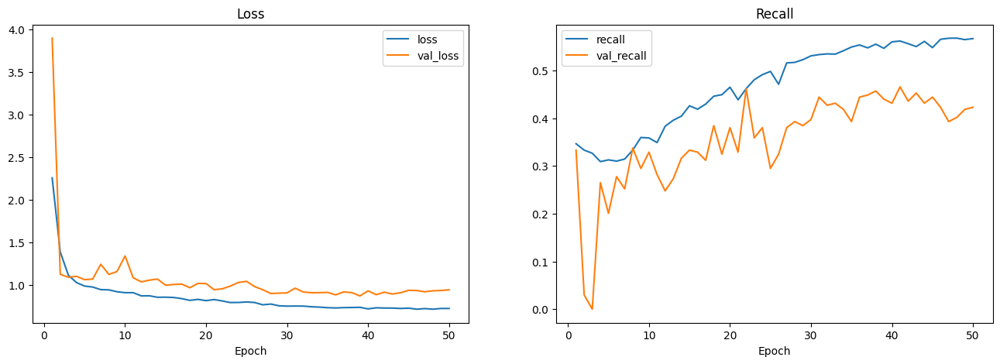

In [ ]:
epoch=50

fig, ax = plt.subplots(ncols=2,figsize=(16,5))
ax[0].plot(range(1,epoch+1),history_1c.history['loss'],label='loss')
ax[0].plot(range(1,epoch+1),history_1c.history['val_loss'],label='val_loss')
ax[0].set_title('Loss')
ax[0].legend()
ax[0].set_xlabel('Epoch')
#ax[0].set_ylim(0,0.01)

ax[1].plot(range(1,epoch+1),history_1c.history['Recall'],label='recall')
ax[1].plot(range(1,epoch+1),history_1c.history['val_Recall'],label='val_recall')
ax[1].set_title('Recall')
ax[1].legend()
ax[1].set_xlabel('Epoch')
#ax[1].set_ylim(0.5,1.5)

plt.show()

#### Testing & Evaluation

In [10]:
load_model = load_model('model_IC_skripsi_2.keras')

In [ ]:
test = load_model.predict(test_gen)

c:\Users\dinda\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


5/5 ━━━━━━━━━━━━━━━━━━━━ 70s 14s/step


In [ ]:
train = load_model.predict(train_gen_aug)

33/33 ━━━━━━━━━━━━━━━━━━━━ 34s 1s/step


In [ ]:
test.argmax(axis=1)

array([2, 2, 0, 0, 2, 1, 1, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 1, 2, 2, 2,
       2, 1, 0, 2, 2, 2, 1, 2, 1, 0, 2, 2, 2, 1, 2, 0, 1, 1, 1, 0, 0, 0,
       2, 1, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 2, 0, 1, 1, 2, 1, 0, 0,
       2, 0, 1, 1, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0,
       0, 2, 0, 0, 1, 0, 0, 0, 2, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 2,
       0, 0, 2, 0, 0, 2, 0, 0, 1, 2, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1,
       2, 2, 1, 2, 2, 2, 1, 2, 1, 2, 1, 1, 2, 1, 2, 1, 2, 1, 1, 1, 1, 2,
       2, 1, 1, 2, 2, 1, 0, 1, 0, 0, 2, 2, 1, 2, 2, 1, 0, 0, 0, 2, 1, 0,
       1, 0, 2, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 2, 2, 0, 0, 1, 1, 1,
       0, 2, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 2, 0, 1, 0, 0, 1, 0, 1, 1, 1,
       1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 2, 0, 0, 1, 1, 1, 0,
       2, 0, 1, 0, 0, 0, 0, 0, 2, 1, 0, 0, 0, 2, 2, 1, 2, 2, 1, 0, 1, 2,
       2, 2, 0, 2, 0, 0, 0, 0, 1, 2, 0, 1, 0, 0, 2, 2, 1, 0, 2, 0, 0, 2,
       0, 1, 0, 0, 1, 1, 1, 1, 2, 2, 0, 1, 1, 2, 1,

In [ ]:
test_gen.labels

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

##### Classification Report

In [ ]:
print(classification_report(test_gen.labels, test.argmax(axis=1)))
print("")
print("Accuracy score Train-set on Model IC : ", accuracy_score(np.argmax(y_train_aug, axis=1), train.argmax(axis=1)))
print("Accuracy score Test-set on Model IC : ", accuracy_score(test_gen.labels, test.argmax(axis=1)))
print("")
print("Precision score Train-set on Model IC : ", precision_score(np.argmax(y_train_aug, axis=1), train.argmax(axis=1), average='weighted'))
print("Precision score Test-set on Model IC : ", precision_score(test_gen.labels, test.argmax(axis=1), average='weighted'))
print("")
print("Recall score Train-set on Model IC : ", recall_score(np.argmax(y_train_aug, axis=1), train.argmax(axis=1), average='weighted'))
print("Recall score Test-set on Model IC : ", recall_score(test_gen.labels, test.argmax(axis=1), average='weighted'))

              precision    recall  f1-score   support

           0       0.30      0.50      0.38       117
           1       0.88      0.47      0.61       393
           2       0.34      0.76      0.47        90

    accuracy                           0.52       600
   macro avg       0.51      0.57      0.48       600
weighted avg       0.68      0.52      0.54       600


Accuracy score Train-set on Model IC :  0.32847424684159376
Accuracy score Test-set on Model IC :  0.515

Precision score Train-set on Model IC :  0.3280456647222939
Precision score Test-set on Model IC :  0.6836792778185184

Recall score Train-set on Model IC :  0.32847424684159376
Recall score Test-set on Model IC :  0.515


##### Confusion Matrix

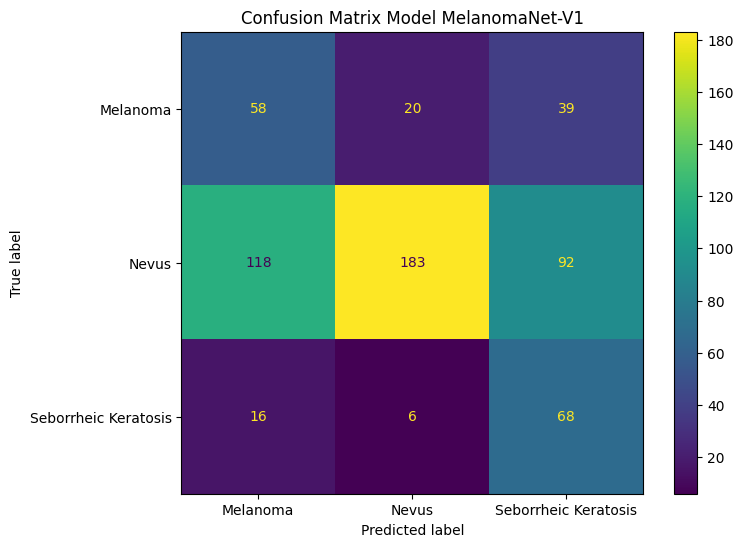

In [ ]:
cm = confusion_matrix(test_gen.labels, test.argmax(axis=1))

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Melanoma', 'Nevus', 'Seborrheic Keratosis'])

fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(ax=ax)
ax.set_title('Confusion Matrix Model MelanomaNet-V1')

plt.show()

# 6 - Layer Visualization

## 6.2 - Activation Visualization

In [7]:
# Defining models to visualize each layer
layer_outputs = [layer.output for layer in model.layers]

# Conv2D #1
conv2d_1_model = Model(inputs=model.input, outputs=layer_outputs[1])

# Activation #1
activation_1_model = Model(inputs=model.input, outputs=layer_outputs[3])

# MaxPooling2D #1
maxpooling2d_1_model = Model(inputs=model.input, outputs=layer_outputs[4])

# Conv2D #2
conv2d_2_model = Model(inputs=model.input, outputs=layer_outputs[5])

# Activation #2
activation_2_model = Model(inputs=model.input, outputs=layer_outputs[7])

# MaxPooling2D #2
maxpooling2d_2_model = Model(inputs=model.input, outputs=layer_outputs[8])

# Conv2D #3
conv2d_3_model = Model(inputs=model.input, outputs=layer_outputs[9])

# Conv2D #4
conv2d_4_model = Model(inputs=model.input, outputs=layer_outputs[10])

# MaxPooling2D #3
maxpooling2d_4_model = Model(inputs=model.input, outputs=layer_outputs[11])

# Conv2D #5
conv2d_5_model = Model(inputs=model.input, outputs=layer_outputs[13])

def visualize_activation(model, input_image):
    activation = model.predict(input_image)
    activation = np.squeeze(activation, axis=0)
    
    activation = (activation * 255).astype(np.uint8)
    
    n_filters = activation.shape[-1]
    size = activation.shape[1]
    n_cols = 16
    n_rows = n_filters // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(2 * n_cols, 2 * n_rows))
    
    for i in range(n_filters):
        row = i // n_cols
        col = i % n_cols
        axes[row, col].imshow(activation[:, :, i], cmap='viridis')
        axes[row, col].set_title(f'Filter {i+1}')
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()

In [8]:
# Read image from path
img_path = r'C:\Users\dinda\OneDrive\Documents\KULIAH\Skripsi\Project\visualization test\ISIC_0000139.jpg'
img = image.load_img(img_path, target_size=input_dim[:2])
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


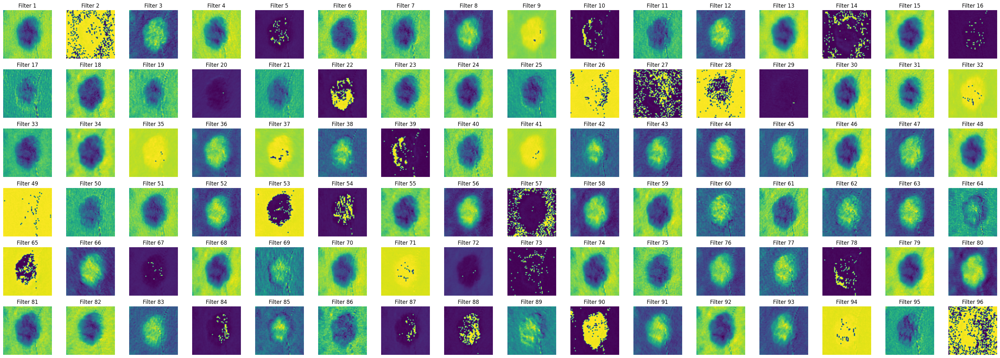

In [9]:
visualize_activation(conv2d_1_model, img_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


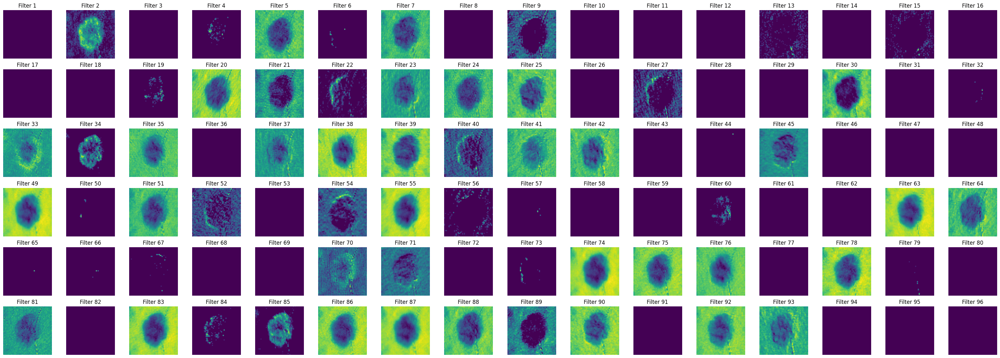

In [10]:
visualize_activation(activation_1_model, img_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


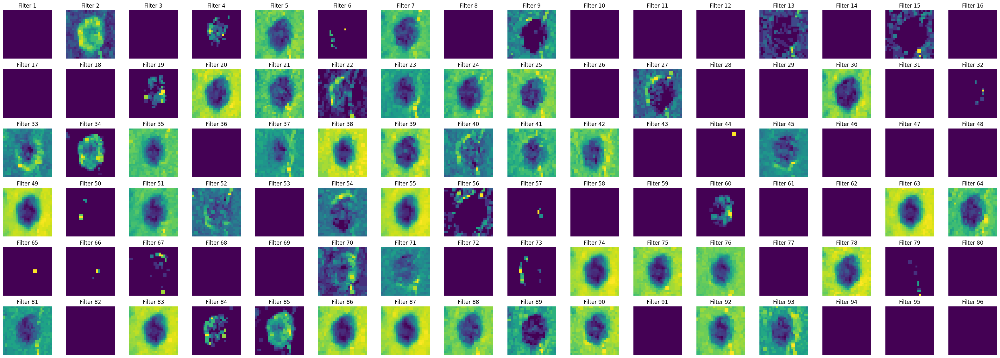

In [11]:
visualize_activation(maxpooling2d_1_model, img_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


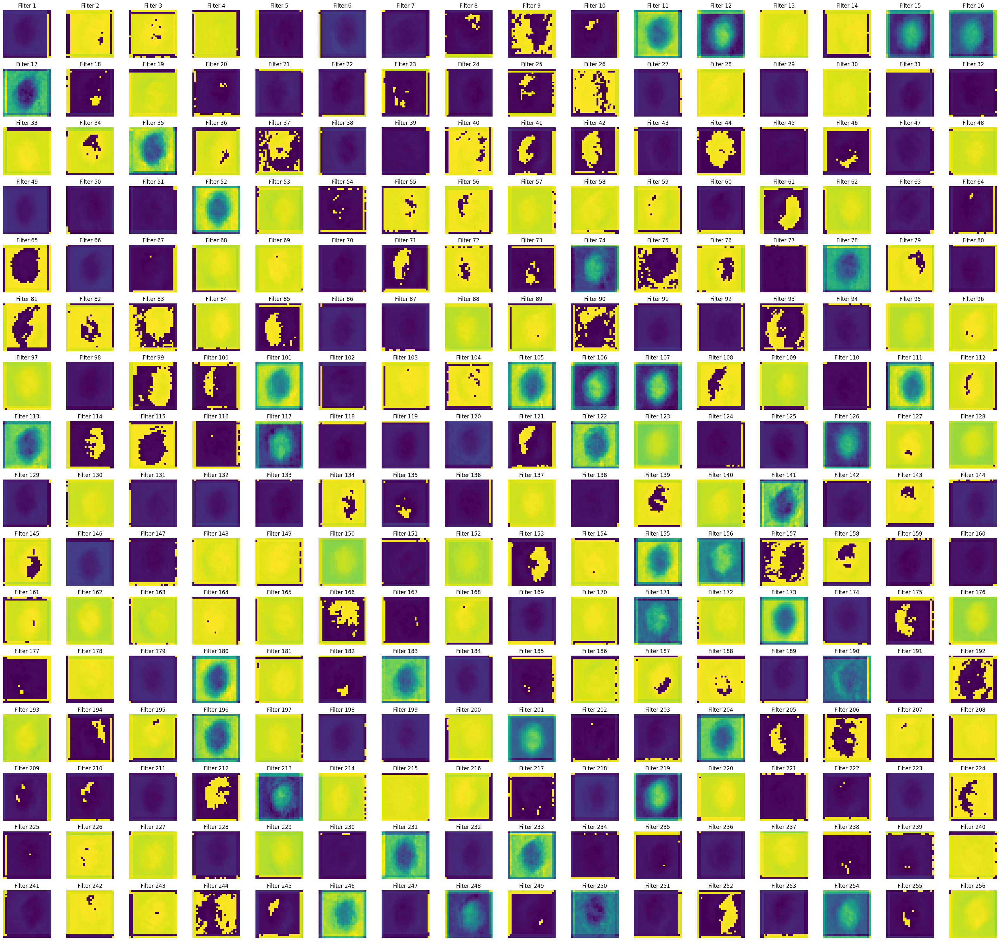

In [12]:
visualize_activation(conv2d_2_model, img_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


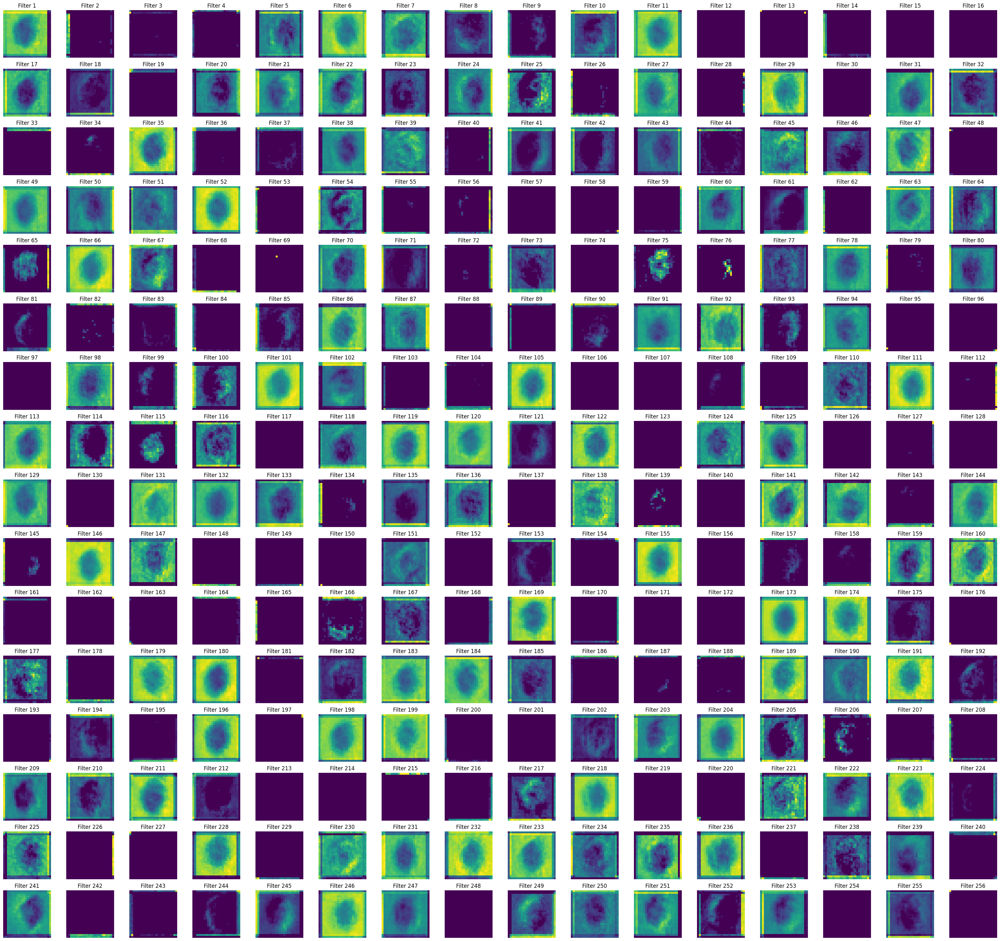

In [14]:
visualize_activation(activation_2_model, img_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


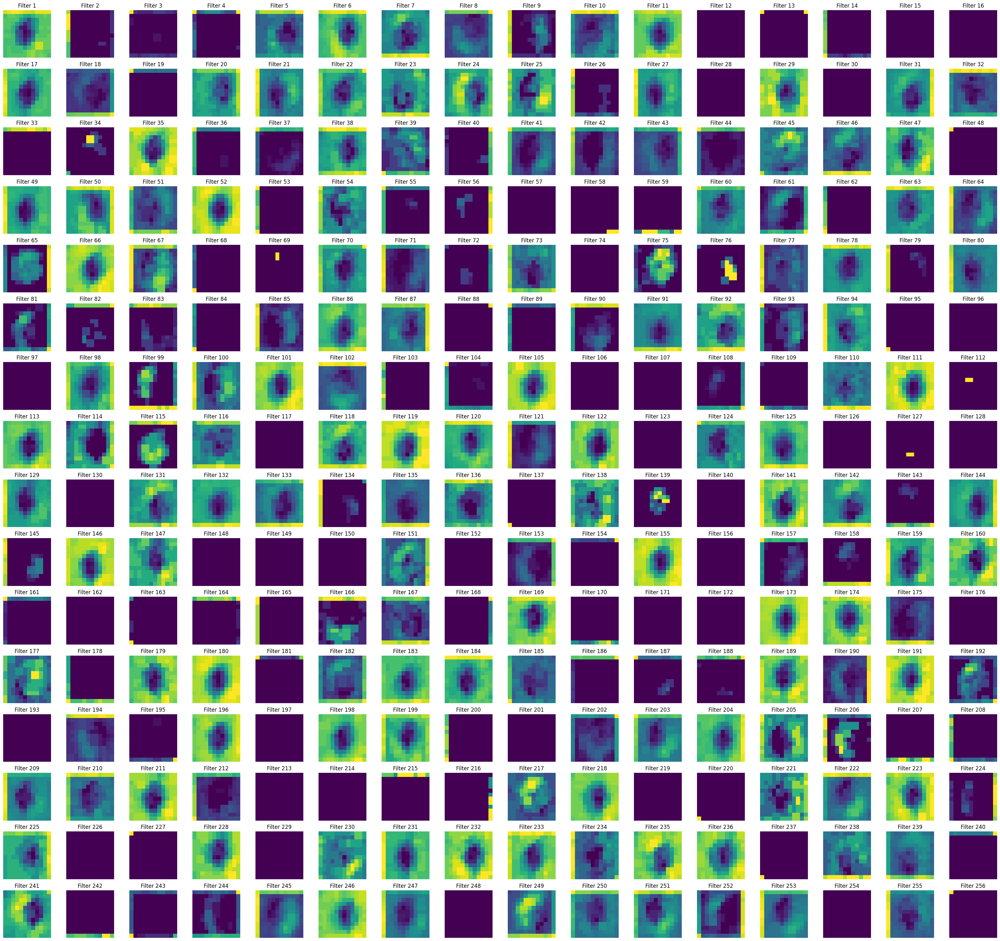

In [15]:
visualize_activation(maxpooling2d_2_model, img_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


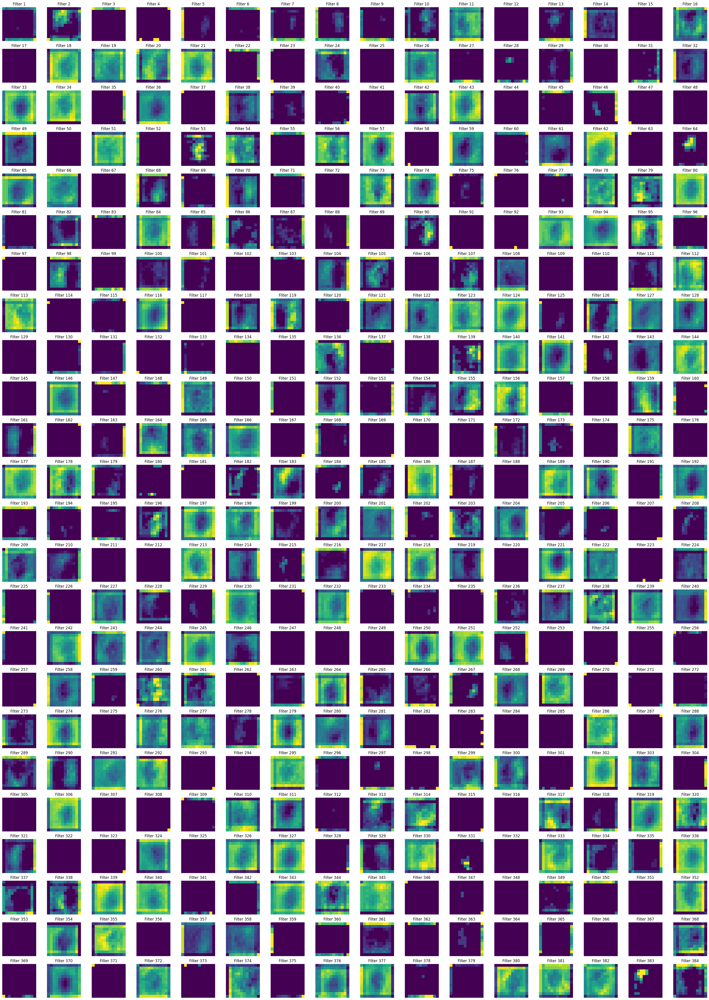

In [16]:
visualize_activation(conv2d_3_model, img_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


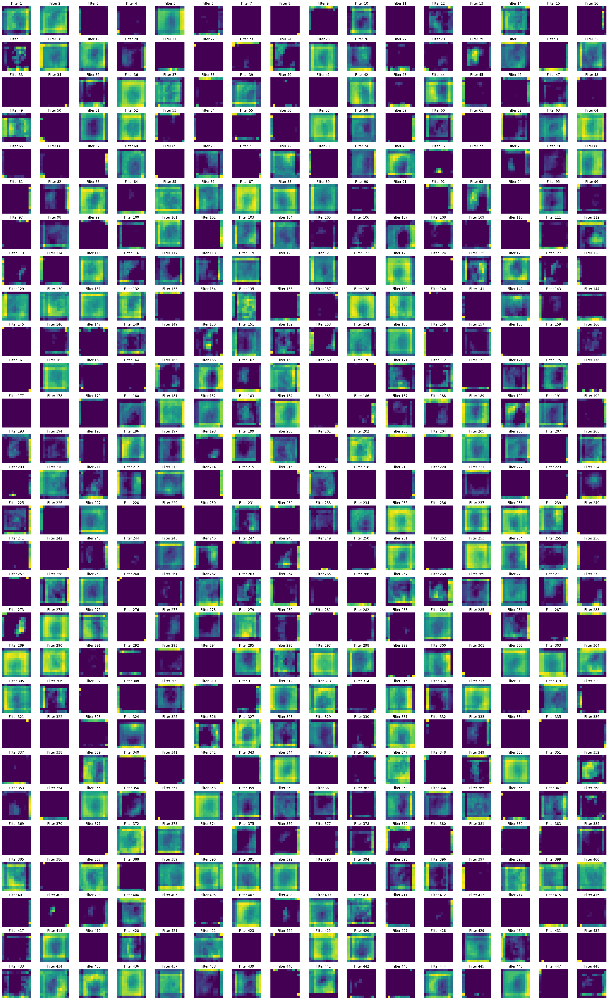

In [96]:
visualize_activation(conv2d_4_model, img_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


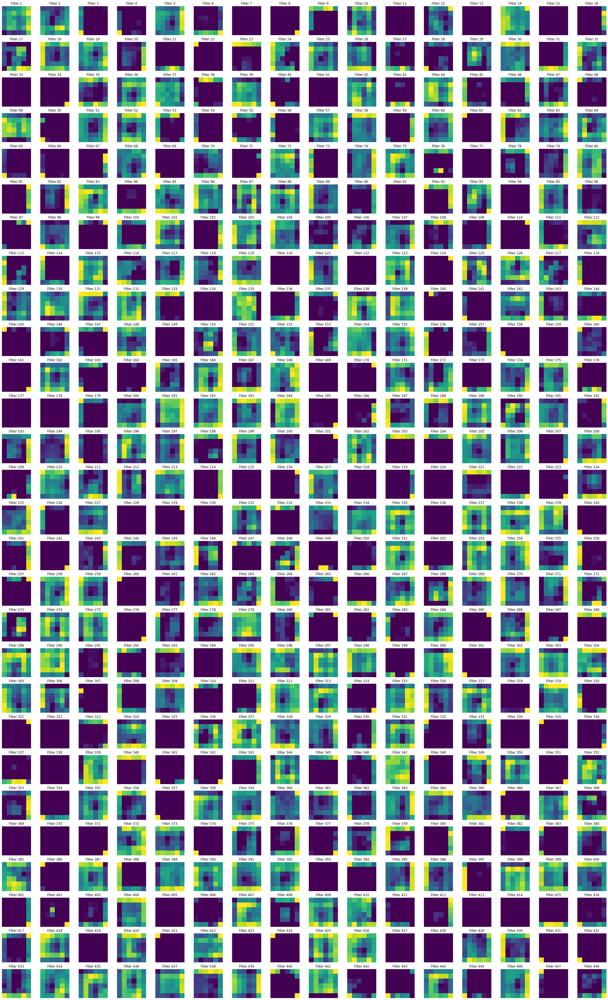

In [97]:
visualize_activation(maxpooling2d_4_model, img_array)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step


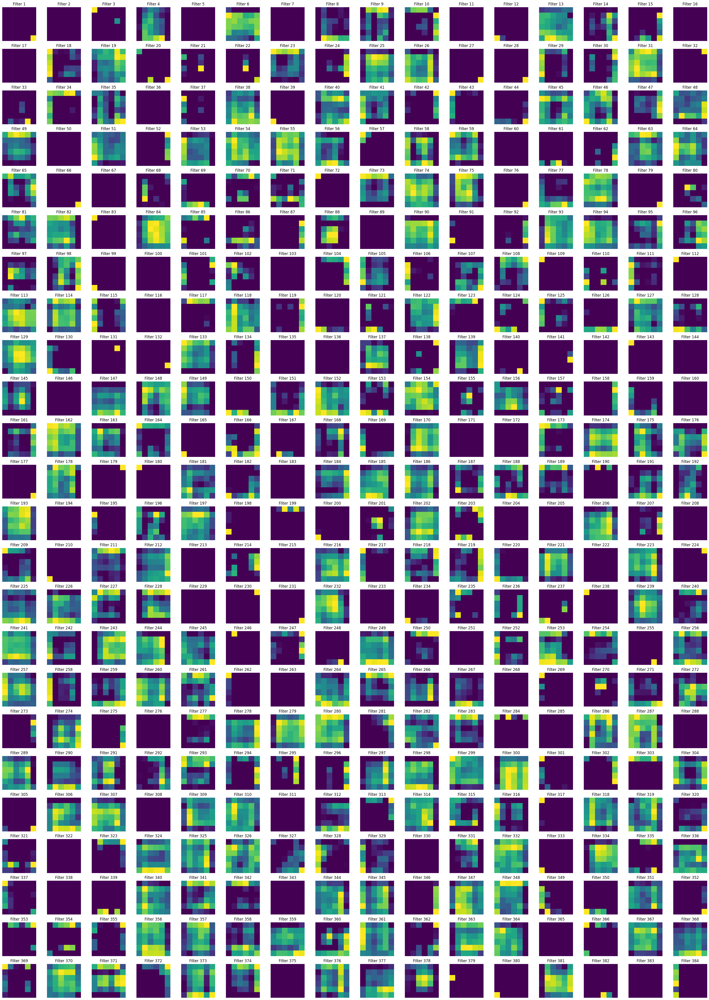

In [98]:
visualize_activation(conv2d_5_model, img_array)

## 6.2 - Saliency Map

In [6]:
def generate_grad_cam(model, layer_name, input_image):
    # Getting last convolutional layer based on its name
    layer = model.get_layer(layer_name)

    # Creating new model from input until desired layer
    grad_model = keras.Model(inputs=model.inputs, outputs=[layer.output, model.output])

    # Computing output gradient toward activation layer
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(input_image)
        loss = predictions[:, np.argmax(predictions[0])]

    # Getting output gradient toward activation layer
    output = conv_outputs[0]
    grads = tape.gradient(loss, conv_outputs)[0]

    # Multiplying each activation with its gradient and summing them up
    weights = tf.reduce_mean(grads, axis=(0, 1))
    cam = np.ones(output.shape[0: 2], dtype=np.float32)

    for i, w in enumerate(weights):
        cam += w * output[:, :, i]

    # Normalize the saliency map
    cam = cv2.resize(cam.numpy(), (input_image.shape[2], input_image.shape[1]))
    cam = np.maximum(cam, 0)
    heatmap = (cam - cam.min()) / (cam.max() - cam.min())

    # Convert saliency map to RGB format
    jet_cam = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    jet_cam = keras.preprocessing.image.array_to_img(jet_cam)
    jet_cam = jet_cam.resize((input_image.shape[2], input_image.shape[1]))
    jet_cam = keras.preprocessing.image.img_to_array(jet_cam)

    # Combining saliency map with input image
    saliency_map = cv2.addWeighted(jet_cam, 0.5, input_image[0], 0.5, 0)
    saliency_map = keras.preprocessing.image.array_to_img(saliency_map)

    return saliency_map

C:\Users\dinda\AppData\Local\Temp\ipykernel_12844\4136987505.py:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


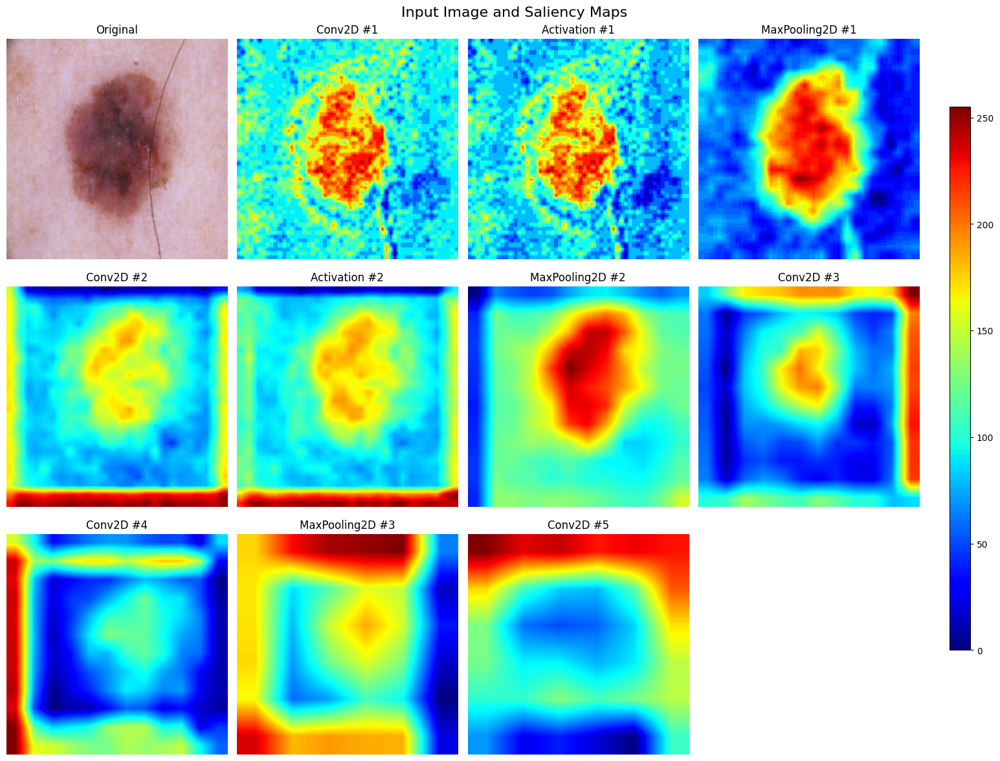

In [9]:
# Load input image
img_path = r'C:\Users\dinda\OneDrive\Documents\KULIAH\Skripsi\Project\visualization test\ISIC_0000139.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0

# List of layer names to be visualized
layer_names = ['conv2d', 'activation', 'max_pooling2d', 'conv2d_1', 'activation_1', 'max_pooling2d_1',
               'conv2d_2', 'conv2d_3', 'max_pooling2d_2', 'conv2d_4']

# List of new layer names to be displayed on the plot
new_layer_names = ['Conv2D #1', 'Activation #1', 'MaxPooling2D #1', 'Conv2D #2', 'Activation #2', 'MaxPooling2D #2',
                   'Conv2D #3', 'Conv2D #4', 'MaxPooling2D #3', 'Conv2D #5']

# Display the original image and saliency map for each layer
num_cols = 4  
num_rows = math.ceil((len(layer_names) + 1) / num_cols)
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 4 * num_rows)) 
fig.suptitle('Input Image and Saliency Maps', fontsize=16)

# Input image
axes[0, 0].imshow(img)
axes[0, 0].set_title('Original')
axes[0, 0].axis('off')

# Saliency map for each layer
for i, (layer_name, new_layer_name) in enumerate(zip(layer_names, new_layer_names)):
    row = (i + 1) // num_cols
    col = (i + 1) % num_cols
    saliency_map = generate_grad_cam(model, layer_name, img_array)
    im = axes[row, col].imshow(saliency_map, cmap='jet')
    axes[row, col].set_title(new_layer_name)
    axes[row, col].axis('off')

# Adding colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
fig.colorbar(im, cax=cbar_ax)

# Deleting unused subplots
for i in range(len(layer_names) + 1, num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

plt.subplots_adjust(right=0.9)

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

C:\Users\dinda\AppData\Local\Temp\ipykernel_12844\3601467352.py:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


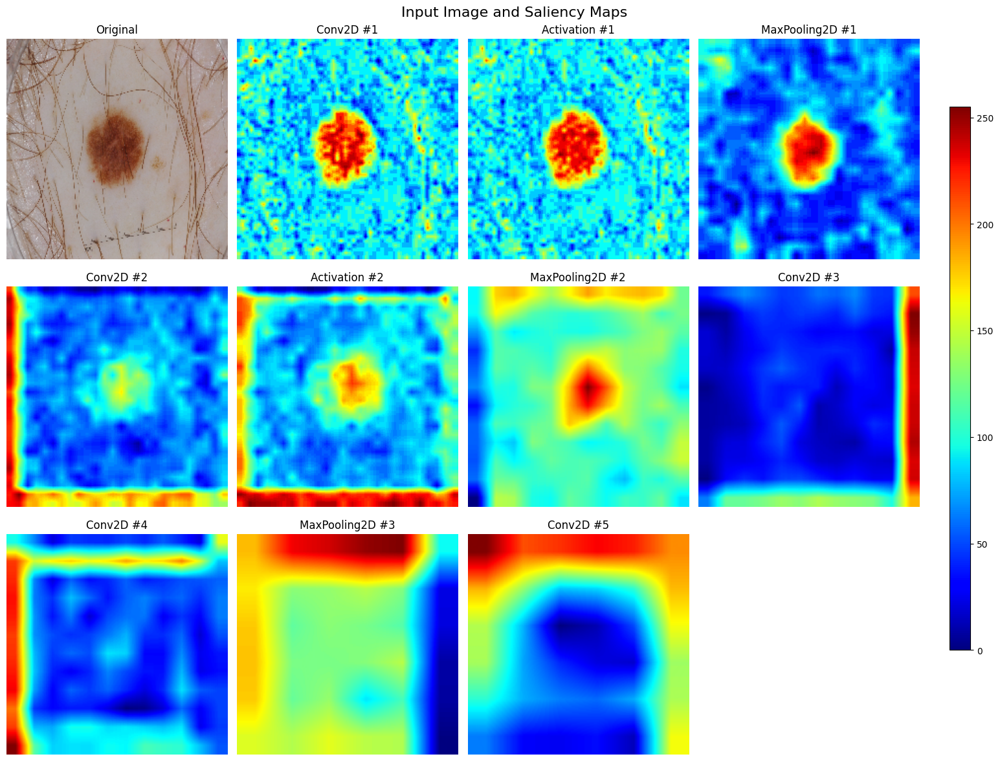

In [11]:
# Load input image
img_path = r'C:\Users\dinda\OneDrive\Documents\KULIAH\Skripsi\Project\visualization test\ISIC_0012442.jpg'
img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0

# List of layer names to be visualized
layer_names = ['conv2d', 'activation', 'max_pooling2d', 'conv2d_1', 'activation_1', 'max_pooling2d_1',
               'conv2d_2', 'conv2d_3', 'max_pooling2d_2', 'conv2d_4']

# List of new layer names to be displayed on the plot
new_layer_names = ['Conv2D #1', 'Activation #1', 'MaxPooling2D #1', 'Conv2D #2', 'Activation #2', 'MaxPooling2D #2',
                   'Conv2D #3', 'Conv2D #4', 'MaxPooling2D #3', 'Conv2D #5']

# Display the original image and saliency map for each layer
num_cols = 4  
num_rows = math.ceil((len(layer_names) + 1) / num_cols)
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 4 * num_rows)) 
fig.suptitle('Input Image and Saliency Maps', fontsize=16)

# Input image
axes[0, 0].imshow(img)
axes[0, 0].set_title('Original')
axes[0, 0].axis('off')

# Saliency map for each layer
for i, (layer_name, new_layer_name) in enumerate(zip(layer_names, new_layer_names)):
    row = (i + 1) // num_cols
    col = (i + 1) % num_cols
    saliency_map = generate_grad_cam(model, layer_name, img_array)
    im = axes[row, col].imshow(saliency_map, cmap='jet')
    axes[row, col].set_title(new_layer_name)
    axes[row, col].axis('off')

# Adding colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
fig.colorbar(im, cax=cbar_ax)

# Deleting unused subplots
for i in range(len(layer_names) + 1, num_rows * num_cols):
    row = i // num_cols
    col = i % num_cols
    fig.delaxes(axes[row, col])

plt.subplots_adjust(right=0.9)

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

# 7 - AlexNet (For Model Comparison)

## 7.1 - Architecture

In [ ]:
input_alexnet = Input(shape=(224, 224, 3))

layer_alexnet = Conv2D(96, kernel_size=(11, 11), strides=(4, 4), activation='relu', padding='valid')(input_alexnet)
layer_alexnet = BatchNormalization()(layer_alexnet)
layer_alexnet = MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(layer_alexnet)

layer_alexnet = Conv2D(256, kernel_size=(5, 5), activation='relu', padding='same')(layer_alexnet)
layer_alexnet = BatchNormalization()(layer_alexnet)
layer_alexnet = MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(layer_alexnet)

layer_alexnet = Conv2D(384, kernel_size=(3, 3), activation='relu', padding='same')(layer_alexnet)

layer_alexnet = Conv2D(384, kernel_size=(3, 3), activation='relu', padding='same')(layer_alexnet)

layer_alexnet = Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same')(layer_alexnet)
layer_alexnet = MaxPooling2D(pool_size=(3, 3), strides=(2, 2))(layer_alexnet)

layer_alexnet = Flatten()(layer_alexnet)

layer_alexnet = Dense(4096, activation='relu')(layer_alexnet)
layer_alexnet = Dropout(0.5)(layer_alexnet)

layer_alexnet = Dense(4096, activation='relu')(layer_alexnet)
layer_alexnet = Dropout(0.5)(layer_alexnet)

output_alexnet = Dense(num_classes, activation='softmax')(layer_alexnet)

alexnet = Model(inputs=input_alexnet, outputs=output_alexnet)

optimizer=SGD(learning_rate=0.01, momentum=0.9, decay=0.0005)
alexnet.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['Recall'])

# Print the model summary
alexnet.summary()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 54, 54, 96)     │        34,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 54, 54, 96)     │           384 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 26, 26, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 26, 26, 256)    │       614,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 26, 26, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 12, 12, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 12, 12, 384)    │       885,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 12, 12, 384)    │     1,327,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 12, 12, 256)    │       884,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 5, 5, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 6400)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 4096)           │    26,218,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 3)              │        12,291 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 46,760,707 (178.38 MB)

 Trainable params: 46,760,003 (178.38 MB)

 Non-trainable params: 704 (2.75 KB)

## 7.2 - Training

In [ ]:
reduce_lr_alexnet = ReduceLROnPlateau(
    monitor='val_loss', 
    factor=0.1, 
    patience=15, 
    min_lr=1e-6, 
    verbose=1
)

In [ ]:
checkpoint_filepath_alexnet = 'alexnet_skripsi.keras'

checkpoint_callback_alexnet = ModelCheckpoint(
    filepath=checkpoint_filepath_alexnet,
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

In [ ]:
%%time
history_alexnet = alexnet.fit(
    train_gen_aug, 
    epochs=50, 
    validation_data=valid_gen, 
    callbacks=[checkpoint_callback_alexnet, reduce_lr_alexnet]
)

Epoch 1/50
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - Recall: 0.1382 - loss: 1.7162
Epoch 1: val_loss improved from inf to 1.04763, saving model to alexnet_skripsi.keras
33/33 ━━━━━━━━━━━━━━━━━━━━ 80s 2s/step - Recall: 0.1365 - loss: 1.7035 - val_Recall: 0.1000 - val_loss: 1.0476 - learning_rate: 0.0100
Epoch 2/50
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - Recall: 0.1497 - loss: 1.0609
Epoch 2: val_loss did not improve from 1.04763
33/33 ━━━━━━━━━━━━━━━━━━━━ 68s 2s/step - Recall: 0.1505 - loss: 1.0605 - val_Recall: 0.1467 - val_loss: 1.1667 - learning_rate: 0.0100
Epoch 3/50
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - Recall: 0.2482 - loss: 0.9956
Epoch 3: val_loss improved from 1.04763 to 1.01842, saving model to alexnet_skripsi.keras
33/33 ━━━━━━━━━━━━━━━━━━━━ 68s 2s/step - Recall: 0.2489 - loss: 0.9954 - val_Recall: 0.1133 - val_loss: 1.0184 - learning_rate: 0.0100
Epoch 4/50
33/33 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - Recall: 0.3251 - loss: 0.9520
Epoch 4: val_loss did not improve from 1.01842
3

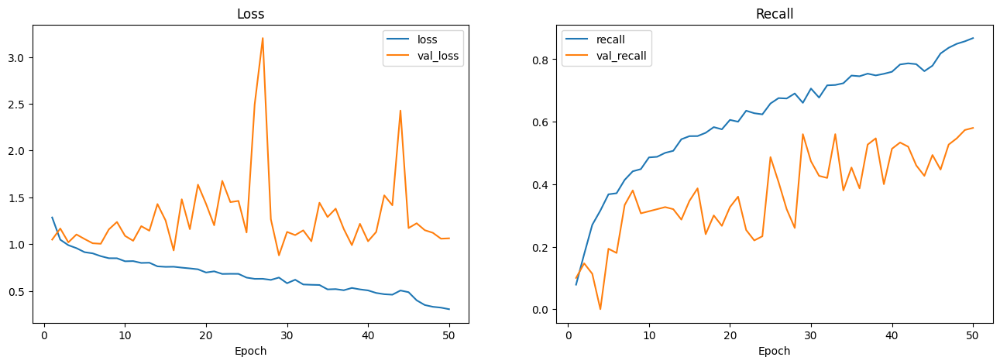

In [ ]:
epoch=50

fig, ax = plt.subplots(ncols=2,figsize=(16,5))
ax[0].plot(range(1,epoch+1),history_alexnet.history['loss'],label='loss')
ax[0].plot(range(1,epoch+1),history_alexnet.history['val_loss'],label='val_loss')
ax[0].set_title('Loss')
ax[0].legend()
ax[0].set_xlabel('Epoch')
#ax[0].set_ylim(0,0.01)

ax[1].plot(range(1,epoch+1),history_alexnet.history['Recall'],label='recall')
ax[1].plot(range(1,epoch+1),history_alexnet.history['val_Recall'],label='val_recall')
ax[1].set_title('Recall')
ax[1].legend()
ax[1].set_xlabel('Epoch')
#ax[1].set_ylim(0.5,1.5)

plt.show()

## 7.3 - Testing & Evaluation

In [ ]:
load_model_alexnet = load_model('alexnet_skripsi.keras')

In [ ]:
test_alexnet = load_model_alexnet.predict(test_gen)

5/5 ━━━━━━━━━━━━━━━━━━━━ 72s 14s/step


In [ ]:
train_alexnet = load_model_alexnet.predict(train_gen_aug)

33/33 ━━━━━━━━━━━━━━━━━━━━ 37s 1s/step


In [ ]:
test_alexnet.argmax(axis=1)

array([2, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 2, 1, 2, 0, 1, 1, 1, 1, 0, 2, 2,
       0, 1, 1, 1, 2, 1, 2, 2, 1, 2, 0, 0, 0, 1, 2, 1, 1, 1, 2, 1, 2, 2,
       0, 1, 1, 1, 1, 1, 0, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 2,
       0, 1, 1, 1, 2, 1, 0, 0, 2, 0, 2, 0, 0, 0, 2, 2, 2, 1, 0, 0, 1, 1,
       0, 2, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 2, 1, 0, 0, 1, 1, 0, 1,
       0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2,
       1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 2, 0, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1,
       1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 2, 1, 1, 1,
       1, 2, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 2,
       0, 0, 1, 2, 0, 0, 0, 0, 1, 1, 1, 2, 1, 2, 2, 1, 2, 0, 1, 0, 1, 1,
       0, 1, 2, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 2, 1, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 1, 1, 0, 2, 1, 1, 1, 0, 1,

In [ ]:

test_gen.labels

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [ ]:
print(classification_report(test_gen.labels, test_alexnet.argmax(axis=1)))
print("")
print("Accuracy score Train-set on Model IC : ", accuracy_score(np.argmax(y_train_aug, axis=1), train_alexnet.argmax(axis=1)))
print("Accuracy score Test-set on Model IC : ", accuracy_score(test_gen.labels, test_alexnet.argmax(axis=1)))
print("")
print("Precision score Train-set on Model IC : ", precision_score(np.argmax(y_train_aug, axis=1), train_alexnet.argmax(axis=1), average='weighted'))
print("Precision score Test-set on Model IC : ", precision_score(test_gen.labels, test_alexnet.argmax(axis=1), average='weighted'))
print("")
print("Recall score Train-set on Model IC : ", recall_score(np.argmax(y_train_aug, axis=1), train_alexnet.argmax(axis=1), average='weighted'))
print("Recall score Test-set on Model IC : ", recall_score(test_gen.labels, test_alexnet.argmax(axis=1), average='weighted'))

              precision    recall  f1-score   support

           0       0.30      0.27      0.29       117
           1       0.75      0.69      0.72       393
           2       0.39      0.56      0.46        90

    accuracy                           0.59       600
   macro avg       0.48      0.51      0.49       600
weighted avg       0.61      0.59      0.60       600


Accuracy score Train-set on Model IC :  0.32896015549076774
Accuracy score Test-set on Model IC :  0.5916666666666667

Precision score Train-set on Model IC :  0.32574008208802063
Precision score Test-set on Model IC :  0.6059384488900739

Recall score Train-set on Model IC :  0.32896015549076774
Recall score Test-set on Model IC :  0.5916666666666667


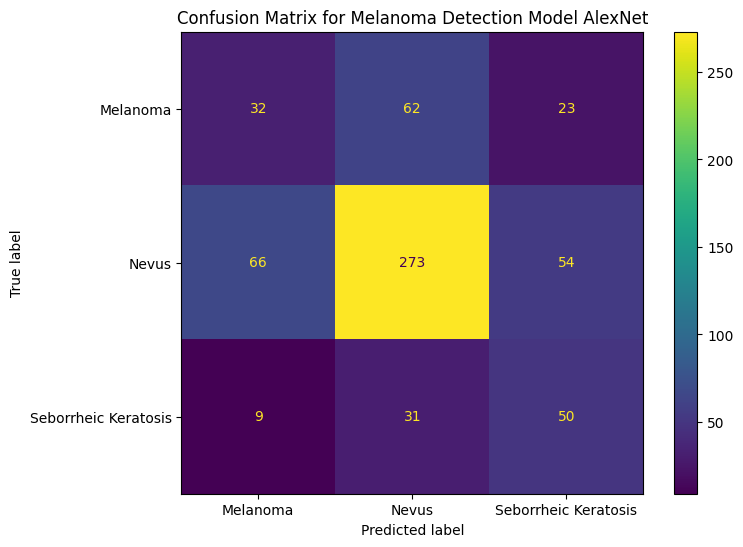

In [ ]:
cm = confusion_matrix(test_gen.labels, test_alexnet.argmax(axis=1))

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Melanoma', 'Nevus', 'Seborrheic Keratosis'])

fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(ax=ax)
ax.set_title('Confusion Matrix for Melanoma Detection Model AlexNet')

plt.show()